#3D Object Detection & Visualization!
In this notebook,a sequence of images and point clouds, and will learn to run 3D object detection algorithms to them. We will also learn how to visualize our results in 2D and 3D environments. So let us begin.
<p>

**Note:** This notebook has been adapted for educational purpose from [this repo](https://github.com/hailanyi/3D-Detection-Tracking-Viewer), and the model is running with weights downloaded on [this repo](https://github.com/open-mmlab/OpenPCDet).

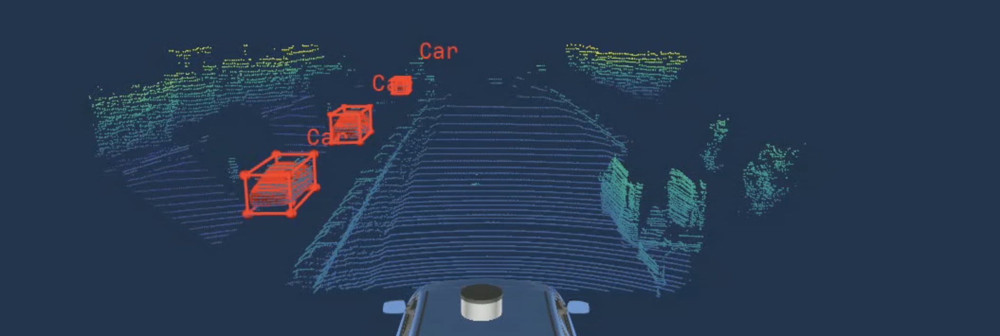

In [ ]:
from IPython.display import Javascript
Javascript('''
  function keepAlive() {
    console.log("Keeping Colab tab alive...");
    document.querySelector("colab-toolbar-button").click();
  }
  setInterval(keepAlive, 60 * 1000);
''')

<IPython.core.display.Javascript object>

## **Introduction:** Data Download & Colab Setup (5 min)


In [ ]:
# Download and install CUDA 11.8 in Colab
!wget https://developer.download.nvidia.com/compute/cuda/11.8.0/local_installers/cuda_11.8.0_520.61.05_linux.run
!sudo sh cuda_11.8.0_520.61.05_linux.run --silent --toolkit
import os
os.environ['PATH'] = '/usr/local/cuda-11.8/bin:' + os.environ['PATH']
os.environ['LD_LIBRARY_PATH'] = '/usr/local/cuda-11.8/lib64:' + os.environ.get('LD_LIBRARY_PATH', '')
!nvcc --version

--2025-05-18 12:39:39--  https://developer.download.nvidia.com/compute/cuda/11.8.0/local_installers/cuda_11.8.0_520.61.05_linux.run
Resolving developer.download.nvidia.com (developer.download.nvidia.com)... 23.52.40.58, 23.52.40.48, 23.52.40.73, ...
Connecting to developer.download.nvidia.com (developer.download.nvidia.com)|23.52.40.58|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4336730777 (4.0G) [application/octet-stream]
Saving to: ‘cuda_11.8.0_520.61.05_linux.run’

cuda_11.8.0_520.61. 100%[===================>]   4.04G   225MB/s    in 29s     

2025-05-18 12:40:09 (144 MB/s) - ‘cuda_11.8.0_520.61.05_linux.run’ saved [4336730777/4336730777]

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0


In [ ]:
# Step 1: Install Python 3.10 and necessary components
!sudo apt-get update
!sudo apt-get install python3.10 python3.10-dev python3.10-distutils -y

# Step 2: Install pip for Python 3.10
!wget https://bootstrap.pypa.io/get-pip.py
!python3.10 get-pip.py

# Step 3: Upgrade pip
!python3.10 -m pip install --upgrade pip

# Step 4: Set Python 3.10 as the default python3 (if not already done)
!sudo update-alternatives --install /usr/bin/python3 python3 /usr/bin/python3.10 1
!sudo update-alternatives --set python3 /usr/bin/python3.10

# Step 5: Verify Python and pip versions
!python3 --version
!python3 -m pip --version

Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,632 B]
Get:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Get:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [1,683 kB]
Get:4 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Hit:5 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:6 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:7 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Get:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease [24.6 kB]
Get:11 http://security.ubuntu.com/ubuntu jammy-security/restricted amd64 Packages [4,363 kB]
Get:12 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Get:13 https://r2u.stat.il

In [ ]:
# Create a virtual environment using Python 3.10
# Step 1: Install python3.10-venv to allow virtualenv creation
!sudo apt-get update
!sudo apt-get install python3.10-venv -y

# Step 2: Create the virtual environment
!python3.10 -m venv /content/myenv

Hit:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:2 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:3 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:4 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:5 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:6 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:7 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:8 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:9 https://r2u.stat.illinois.edu/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Reading package lists... Done
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Reading package lists... Done
Building dependency tree... Done
Reading

In [ ]:
import gdown
import zipfile
import os

#drivelink = "https://drive.google.com/file/d/1HC3qEXe1Fko7a6HnMGOJBtFPJlg4WxFI/view?usp=sharing"
# Set file ID and destination
file_id = "1HC3qEXe1Fko7a6HnMGOJBtFPJlg4WxFI"  # replace with your file ID
zip_path = "multi_object_tracking.zip"

# Download from Google Drive
gdown.download(f"https://drive.google.com/uc?id={file_id}", zip_path, quiet=False)


!unzip -q multi_object_tracking.zip

Downloading...
From (original): https://drive.google.com/uc?id=1HC3qEXe1Fko7a6HnMGOJBtFPJlg4WxFI
From (redirected): https://drive.google.com/uc?id=1HC3qEXe1Fko7a6HnMGOJBtFPJlg4WxFI&confirm=t&uuid=8ce6fb5a-6bad-4465-acfb-c4d84daaa16d
To: /content/multi_object_tracking.zip
100%|██████████| 701M/701M [00:18<00:00, 37.3MB/s]


### Installing depenencies

In [ ]:
!sudo apt-get install -y xvfb libgl1-mesa-dev libgl1-mesa-glx

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
libgl1-mesa-glx is already the newest version (23.0.4-0ubuntu1~22.04.1).
xvfb is already the newest version (2:21.1.4-2ubuntu1.7~22.04.14).
The following additional packages will be installed:
  libegl-dev libgl-dev libgles-dev libgles1 libglvnd-core-dev libglvnd-dev
  libglx-dev libopengl-dev
The following NEW packages will be installed:
  libegl-dev libgl-dev libgl1-mesa-dev libgles-dev libgles1 libglvnd-core-dev
  libglvnd-dev libglx-dev libopengl-dev
0 upgraded, 9 newly installed, 0 to remove and 89 not upgraded.
Need to get 221 kB of archives.
After this operation, 2,577 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 libglx-dev amd64 1.4.0-1 [14.1 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/main amd64 libgl-dev amd64 1.4.0-1 [101 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/main amd64 libegl-dev amd64 1.4.0-1 [18.0 kB]
Get:4 h

In [ ]:
!source /content/myenv/bin/activate && pip install SharedArray2 spconv-cu118==2.3.5 -q

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.8/75.8 MB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 KB 12.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 25.5/25.5 MB 59.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.3/243.3 KB 27.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.7/73.7 KB 10.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 KB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 422.8/422.8 KB 45.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.0/111.0 KB 16.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 159.6/159.6 KB 20.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.4/70.4 KB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━

In [ ]:
!/content/myenv/bin/pip install \
  git+https://github.com/Jeremy26/vedo-mot.git \
  vtk==9.2.6 \
  "numpy==1.24"

  Cloning https://github.com/Jeremy26/vedo-mot.git to /tmp/pip-req-build-uj_ddrgz
  Running command git clone --filter=blob:none --quiet https://github.com/Jeremy26/vedo-mot.git /tmp/pip-req-build-uj_ddrgz
  Resolved https://github.com/Jeremy26/vedo-mot.git to commit 2bf7b78a631556e9a6b05b21c1e5c53cf4b911bf
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.3/79.3 MB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 61.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.6/8.6 MB 86.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.1/111.1 KB 14.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 229.9/229.9 KB 29.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 325.0/325.0 KB 43.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.5/66.5 KB 11.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 108.5 MB/s eta 0:00:00
     ━

In [ ]:
# Install Xvfb, start it, and set DISPLAY — all in one cell
!apt-get update -qq && apt-get install -y xvfb && sudo apt upgrade -y

# Start Xvfb and set DISPLAY
import os
os.system("Xvfb :99 -screen 0 1024x768x24 &")
os.environ["DISPLAY"] = ":99"

W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
xvfb is already the newest version (2:21.1.4-2ubuntu1.7~22.04.14).
0 upgraded, 0 newly installed, 0 to remove and 89 not upgraded.
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
Calculating upgrade... Done
The following packages were automatically installed and are no longer required:
  libgdal32 libgeos3.11.1 libspatialite7 linux-headers-5.15.0-139
  linux-headers-5.15.0-139-generic
Use 'sudo apt autoremove' to remove them.
The following NEW packages will be installed:
  libgdal34 libgeos3.12.1 libspatialite8 linux-headers-5.15.0-140
  linux-headers-5.15.0-140-generic proj-bin
The following packages have been kept back:
  libcudnn9-cuda-12 libcudnn9-dev-c

In [ ]:
!/content/myenv/bin/pip install "scipy==1.13.0" "scikit-image==0.23.2"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.6/38.6 MB 16.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.7/14.7 MB 85.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 315.8/315.8 KB 44.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 61.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 226.5/226.5 KB 28.8 MB/s eta 0:00:00


In [ ]:
!/content/myenv/bin/pip install torch==2.1.0+cu118 torchvision==0.16.0+cu118 torchaudio==2.1.0 --index-url https://download.pytorch.org/whl/cu118

Looking in indexes: https://download.pytorch.org/whl/cu118
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 GB 478.0 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.2/6.2 MB 102.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 98.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.2/6.2 MB 112.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.3/133.3 KB 19.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.2/89.2 MB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.6/177.6 KB 25.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 536.2/536.2 KB 56.4 MB/s eta 0:00:00


In [ ]:
!/content/myenv/bin/pip install opencv-python

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.0/63.0 MB 10.7 MB/s eta 0:00:00


In [ ]:
!/content/myenv/bin/pip install pyquaternion

In [ ]:
!/content/myenv/bin/pip install av2==0.2.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 640.8/640.8 KB 15.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.2/243.2 KB 30.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.8/34.8 MB 36.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.2/102.2 KB 16.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.7/307.7 KB 39.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 99.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.3/42.3 MB 12.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.8/71.8 KB 11.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 100.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.3/9.3 MB 118.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.1/6.1 MB 113.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.8/63.8 KB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
!/content/myenv/bin/pip install "kornia==0.6.7"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 565.1/565.1 KB 12.4 MB/s eta 0:00:00


In [ ]:
!wget https://thinkautonomous-3d-tracking.s3.us-west-2.amazonaws.com/pointrcnn.zip && unzip pointrcnn.zip
!mv -v pointrcnn/* .

--2025-05-18 12:50:29--  https://thinkautonomous-3d-tracking.s3.us-west-2.amazonaws.com/pointrcnn.zip
Resolving thinkautonomous-3d-tracking.s3.us-west-2.amazonaws.com (thinkautonomous-3d-tracking.s3.us-west-2.amazonaws.com)... 52.92.152.114, 3.5.76.202, 52.218.170.1, ...
Connecting to thinkautonomous-3d-tracking.s3.us-west-2.amazonaws.com (thinkautonomous-3d-tracking.s3.us-west-2.amazonaws.com)|52.92.152.114|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 65713228 (63M) [application/zip]
Saving to: ‘pointrcnn.zip’

pointrcnn.zip       100%[===================>]  62.67M  5.68MB/s    in 13s     

2025-05-18 12:50:42 (4.95 MB/s) - ‘pointrcnn.zip’ saved [65713228/65713228]

Archive:  pointrcnn.zip
   creating: pointrcnn/
  inflating: __MACOSX/._pointrcnn    
  inflating: pointrcnn/pointrcnn.yaml  
  inflating: __MACOSX/pointrcnn/._pointrcnn.yaml  
  inflating: pointrcnn/box_3d.py     
  inflating: __MACOSX/pointrcnn/._box_3d.py  
  inflating: pointrcnn/pointrcnn_7

In [ ]:
# ** important : check and remove pcdet located in /content or else it causes errors, we dont need this, we will be using pcdet from OpenPCDET repo for the entire notebook.**

!rm -rf /content/pcdet

In [ ]:
!git clone https://github.com/open-mmlab/OpenPCDet.git

Cloning into 'OpenPCDet'...
remote: Enumerating objects: 4169, done.
remote: Total 4169 (delta 0), reused 0 (delta 0), pack-reused 4169 (from 1)
Receiving objects: 100% (4169/4169), 4.20 MiB | 18.79 MiB/s, done.
Resolving deltas: 100% (2448/2448), done.


In [ ]:
!/content/myenv/bin/pip install "setuptools<=58.0.0" --force-reinstall

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 816.3/816.3 KB 21.4 MB/s eta 0:00:00
  Attempting uninstall: setuptools
    Found existing installation: setuptools 68.1.2
    Uninstalling setuptools-68.1.2:
      Successfully uninstalled setuptools-68.1.2


In [ ]:
%cd OpenPCDet/
!source /content/myenv/bin/activate && python setup.py develop

/content/OpenPCDet
running develop
running egg_info
creating pcdet.egg-info
writing pcdet.egg-info/PKG-INFO
writing dependency_links to pcdet.egg-info/dependency_links.txt
writing requirements to pcdet.egg-info/requires.txt
writing top-level names to pcdet.egg-info/top_level.txt
writing manifest file 'pcdet.egg-info/SOURCES.txt'
reading manifest file 'pcdet.egg-info/SOURCES.txt'
adding license file 'LICENSE'
writing manifest file 'pcdet.egg-info/SOURCES.txt'
running build_ext
/content/myenv/lib/python3.10/site-packages/torch/utils/cpp_extension.py:424: UserWarning: There are no x86_64-linux-gnu-g++ version bounds defined for CUDA version 11.8
  warnings.warn(f'There are no {compiler_name} version bounds defined for CUDA version {cuda_str_version}')
building 'pcdet.ops.iou3d_nms.iou3d_nms_cuda' extension
creating /content/OpenPCDet/build
creating /content/OpenPCDet/build/temp.linux-x86_64-3.10
creating /content/OpenPCDet/build/temp.linux-x86_64-3.10/pcdet
creating /content/OpenPCDet/bui

In [ ]:
!/content/myenv/bin/pip install matplotlib-inline --force-reinstall

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.4/85.4 KB 2.6 MB/s eta 0:00:00


In [ ]:
!/content/myenv/bin/python -c "import numpy; print(numpy.__version__); import skimage; import vedo; print(vedo.__version__); print('All good!')"

1.24.0
Traceback (most recent call last):
  File "<string>", line 1, in <module>
  File "/content/myenv/lib/python3.10/site-packages/vedo/__init__.py", line 234, in <module>
    np.warnings.filterwarnings('ignore', category=np.VisibleDeprecationWarning)
  File "/content/myenv/lib/python3.10/site-packages/numpy/__init__.py", line 284, in __getattr__
    raise AttributeError("module {!r} has no attribute "
AttributeError: module 'numpy' has no attribute 'warnings'. Did you mean: 'hanning'?


In [ ]:
!/content/myenv/bin/pip install ipython

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 831.1/831.1 KB 13.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.8/63.8 KB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 62.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 387.8/387.8 KB 44.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 103.7/103.7 KB 16.0 MB/s eta 0:00:00


In [ ]:
!sed -i "s/np.warnings.filterwarnings('ignore', category=np.VisibleDeprecationWarning)/import warnings\nwarnings.filterwarnings('ignore', category=np.VisibleDeprecationWarning)/" /content/myenv/lib/python3.10/site-packages/vedo/__init__.py

In [ ]:
%cd ..

/content


In [ ]:
import sys
sys.
import pcdet

# Print all paths where Python is looking for packages
print("Sys path for pcdet:", sys.path)

# Print where the pcdet package is located, this should be from OpenPCDET repository: /content/OpenPCDet/pcdet/
print("pcdet is being imported from:", pcdet.__file__)

ModuleNotFoundError: No module named 'pcdet'

In [ ]:
!python /content/testfile.py

Traceback (most recent call last):
  File "/content/testfile.py", line 3, in <module>
    import pcdet
ModuleNotFoundError: No module named 'pcdet'


## **IMPLEMENTATION**

### **DOWNLOADING THE DATASET**
Next, we download a sequence from the KITTI Dataset. It contains:
* A series of images
* A series of corresponding LiDAR scans
* Calibration Files (setup)
* A Pose file containing the positions of our car

In [ ]:
%%writefile run_kitti_dataset.py

import os
import re
import numpy as np
import sys

from multi_object_tracking.viewer.viewer import Viewer
from multi_object_tracking.viewer.utils import *
from multi_object_tracking.dataset.kitti_data_base import *


from pcdet.config import cfg, cfg_from_yaml_file
from pcdet.datasets import DatasetTemplate
from pcdet.utils import common_utils


class KittiDataset(DatasetTemplate):
    def __init__(self,root_path,seq_id, dataset_cfg, class_names, label_path = None):
        super().__init__(
            dataset_cfg=dataset_cfg, class_names=class_names, training=False, root_path=root_path
        )
        self.seq_name = str(seq_id).zfill(4)
        self.root_path = root_path
        self.velo_path = os.path.join(self.root_path,"velodyne", self.seq_name)
        self.image_path = os.path.join(self.root_path,"image_02", self.seq_name)
        self.calib_path = os.path.join(self.root_path,"calib")
        self.label_path = label_path
        self.class_names = class_names
        self.class_to_idx = {name: i+1 for i, name in enumerate(class_names)}
        pose_path = os.path.join(self.root_path, "pose", self.seq_name,'pose.txt')
        self.poses = read_pose(pose_path)

    def __len__(self):
        return len(os.listdir(self.velo_path))

    def __getitem__(self, item):
        input_dict = {}
        name = str(item).zfill(6)
        velo_path = os.path.join(self.velo_path, name+'.bin')
        image_path = os.path.join(self.image_path, name+'.png')
        calib_path = os.path.join(self.calib_path, self.seq_name+'.txt')

        input_dict["frame_id"] = item
        input_dict["pose"] = self.poses.get(item, None)

        P2, V2C = read_calib(calib_path)
        input_dict.update({"P2": P2, "V2C": V2C})

        input_dict["points"] = read_velodyne(velo_path, P2, V2C)
        input_dict["image"] = read_image(image_path)


        objects, det_scores, det_names = [], [], []
        if self.label_path is not None:
            # If we have a label path, we'll read the labels instead of predicting them
            label_path = os.path.join(self.label_path, self.seq_name, name+'.txt')
            objects, det_scores, det_names = self.read_detection_label(label_path)
        if len(objects)>0:
            objects[:,3:6] = cam_to_velo(objects[:,3:6],V2C)[:,:3]
        input_dict["objects"] = objects
        input_dict["scores"] = det_scores
        input_dict["names"] = det_names

        return input_dict

    def read_detection_label(self,label_path):
        objects_list = []
        det_scores = []
        det_names = []
        with open(label_path) as f:
            for each_ob in f.readlines():
                infos = re.split(' ', each_ob)
                if infos[0] in ['Car', 'Truck','Van', 'Cyclist']:
                    objects_list.append(infos[8:15])
                    det_scores.append(infos[15])
                    det_names.append(infos[0])
        return np.array(objects_list, np.float32), np.array(det_scores, np.float32), det_names


Writing run_kitti_dataset.py


In [ ]:
!/content/myenv/bin/python /content/run_kitti_dataset.py

fatal: not a git repository (or any of the parent directories): .git


### **Label Visualization**

**Understanding the Kitti Dataset Format**

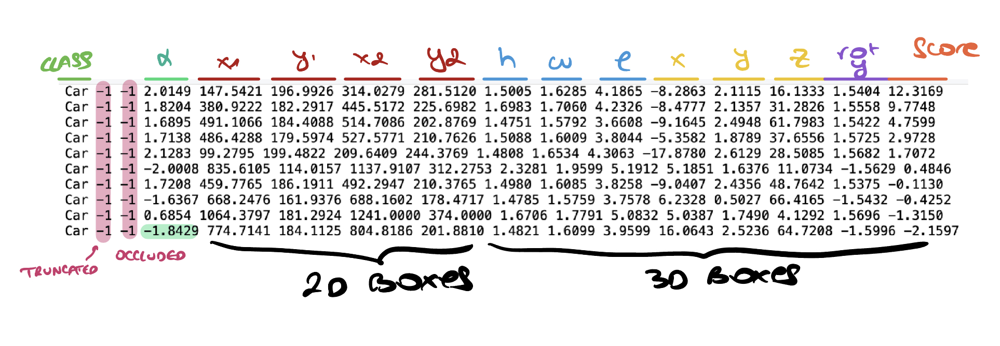


In [ ]:
%%writefile view_dataset_sample.py

import pcdet
from run_kitti_dataset import KittiDataset
from pcdet.config import cfg, cfg_from_yaml_file

cfg_file = "/content/pointrcnn.yaml"
cfg_from_yaml_file(cfg_file, cfg)

root = "multi_object_tracking/data"
seq_id = 8

dataset = KittiDataset(
    root_path=root,
    seq_id=seq_id,
    label_path="multi_object_tracking/detectors/second_iou",
    dataset_cfg=cfg.DATA_CONFIG,
    class_names=cfg.CLASS_NAMES
)

print(f"Loaded dataset with {len(dataset)} frames.")
sample = dataset[0]
print("Sample keys:", sample.keys())


# Print the label data (objects, scores, and names)
objects = sample['objects']
scores = sample['scores']
names = sample['names']

# Print number of objects and first few entries for objects, scores, and names
print(f"Number of objects: {len(objects)}")
print(f"First few objects (bounding boxes): {objects[:5]}")
print(f"Object scores: {scores}")
print(f"Class names of objects: {names}")

# Print V2C and P2 matrices
print("V2C (Velodyne to Camera) Matrix:")
print(sample['V2C'])

print("\nP2 (Projection Matrix for Camera 2):")
print(sample['P2'])

Writing view_dataset_sample.py


In [ ]:
!/content/myenv/bin/python /content/view_dataset_sample.py

fatal: not a git repository (or any of the parent directories): .git
Loaded dataset with 390 frames.
Sample keys: dict_keys(['frame_id', 'pose', 'P2', 'V2C', 'points', 'image', 'objects', 'scores', 'names'])
Number of objects: 11
First few objects (bounding boxes): [[ 1.4479     1.6361     4.1965    16.461056   8.2963915 -1.8232476
  -4.7492   ]
 [ 1.66       1.6993     4.2942    31.722734   8.466339  -1.7148644
  -4.7001   ]
 [ 1.6492     0.5622     1.4813    17.454348  -9.3839445 -1.6451476
  -4.2128   ]
 [ 1.4881     1.6539     4.0733    48.81954    9.130648  -1.7676
  -4.7952   ]
 [ 1.5545     1.5983     3.5203    62.035374   9.379307  -1.7811769
  -4.829    ]]
Object scores: [ 2.4521  1.6828  0.0666 -0.2324 -0.4508 -1.0182 -1.4143 -1.494  -1.5119
 -1.8433 -2.0372]
Class names of objects: ['Car', 'Car', 'Cyclist', 'Car', 'Car', 'Car', 'Car', 'Car', 'Cyclist', 'Car', 'Car']
V2C (Velodyne to Camera) Matrix:
[[ 2.34773604e-04 -9.99944129e-01 -1.05634776e-02 -2.79681677e-03]
 [ 1.04494

### Visualizing the Labels
Let's begin with the visualization data. We have a folder that contains:
* **car.obj**: The 3D object of cars detected
* **ego_car.3ds**: The 3D Object of our car (called ego)
* **color_map.py**: A file that generates colors for detected objects and points
* **box_op.py**: This creates 2D and 3D Bounding Boxes
* **viewer.py**: Our "main" visualizer file (spend time here!!!)
* **utils.py**: An extra file we create to visualize the 3d results as images and videos (this will look cool on your portfolio)


In [ ]:
%%writefile visualize_scene.py

import os
import sys
import torch
import numpy as np
from torch.utils.data import DataLoader
from box_3d import *

from pcdet.utils import common_utils
from pcdet.models import build_network
from pcdet.config import cfg, cfg_from_yaml_file

from multi_object_tracking.dataset.kitti_data_base import velo_to_cam
from multi_object_tracking.viewer.viewer import Viewer
from multi_object_tracking.viewer.utils import *
from multi_object_tracking.dataset.kitti_data_base import *
from run_kitti_dataset import KittiDataset



def visualize_scene(dataset, hand_picked_frames, detection=True, tracking=None, interactive = False, threshold=0.7):
    if not hand_picked_frames:
        hand_picked_frames = range(len(dataset))  #run full sequence

    if interactive==True:
        vi= Viewer(box_type="Kitti", bg=(32,47,70)) # This is needed once for 3D Visualization

    for idx, frame in enumerate(hand_picked_frames):
        frame_id, pose, P2, V2C, points, image, labels, scores, label_names = dataset[frame].values()
        # print(f"\n[Frame {frame}]")
        # print(f"The type of labels are {type(labels)}")
        # print(f"Labels:\n{labels}")
        # print(f"Scores:\n{scores}")
        # print(f"Label Names:\n{label_names}")

        if interactive==False:
            vi = Viewer(box_type="Kitti", bg=(32,47,70)) # this is needed for every frame for 2D Visualization
            vi.set_ego_car("multi_object_tracking/viewer/ego_car.3ds")

        if detection is not None:
            mask = scores > threshold
            labels = labels[mask]
            if tracking is not None:
                ids = tracking[idx]
            else:
                ids = None
            # parsed = [parse_kitti_label_line(l) for l in labels]
            # class_names = [x[0] for x in parsed]
            # boxes = np.array([x[1] for x in parsed])
            vi.add_3D_boxes(labels, ids=ids, box_info=label_names, color="red",
                            add_to_3D_scene=True, mesh_alpha = 0.4, show_corner_spheres = False,
                            corner_spheres_alpha = 1, corner_spheres_radius=0.2,
                            show_heading = True, heading_scale = 1.5, show_lines = True,
                            line_width = 3, line_alpha = 1,
                            show_ids = True, show_box_info=True, del_after_show=True,
                            add_to_2D_scene=True, caption_size=(0.09,0.09)
                            )

            vi.add_3D_cars(labels,
                        ids=ids,
                        box_info=label_names,
                        color="red",
                        mesh_alpha = 1,
                        del_after_show=True,
                        car_model_path="multi_object_tracking/viewer/car.obj",
                        caption_size = (0.1, 0.1)
                        )

        vi.add_points(points[:,0:3],
                    radius = 2,
                    color = (150,150,150),
                    scatter_filed = points[:,2],
                    alpha=1,
                    del_after_show = True,
                    add_to_3D_scene = True,
                    add_to_2D_scene = False,
                    color_map_name = "viridis")

        vi.add_image(image)
        vi.set_extrinsic_mat(V2C)
        vi.set_intrinsic_mat(P2)
        vi.show_2D()
        vi.show_3D(frame, interactive) #set interactive to False

Writing visualize_scene.py


In [ ]:
%%writefile main.py

import pcdet
from vedo import *
import shutil
from visualize_scene import visualize_scene
from pcdet.config import cfg, cfg_from_yaml_file
from run_kitti_dataset import KittiDataset

print(f"'default_image_path_for_2d_backend' exists: {hasattr(settings, 'default_image_path_for_2d_backend')}")

cfg_file = "/content/pointrcnn.yaml"
cfg_from_yaml_file(cfg_file, cfg)

root ="multi_object_tracking/data"
seq_id = 8

label_path = "multi_object_tracking/detectors/second_iou"

dataset = KittiDataset(
    root_path=root,
    seq_id=seq_id,
    label_path=label_path,
    dataset_cfg=cfg.DATA_CONFIG,
    class_names=cfg.CLASS_NAMES
)

#If you need to restart the visualizer, remove the frames stored

shutil.rmtree('frames', ignore_errors=True)
shutil.rmtree("3dframes", ignore_errors= True)

### Just visualize Raw Data
hand_picked_frames = [200,201,202]
settings.default_backend = '2d_image'
settings.default_image_path_for_2d_backend = '3dframes'

visualize_scene(dataset, hand_picked_frames, detection=True, tracking=None, threshold=0.5)

Writing main.py


In [ ]:
!/content/myenv/bin/python /content/main.py

fatal: not a git repository (or any of the parent directories): .git
'default_image_path_for_2d_backend' exists: True
The new directory 'frames' is created!
The new directory 3dframes is created!


In [ ]:
%%writefile /content/view_utils.py

import matplotlib.pyplot as plt
import cv2
import math

def view_images(images_to_be_shown, cols=3, figsize=(20, 20)):
    rows = math.ceil(len(images_to_be_shown) / cols)  # Calculate rows dynamically
    fig, axs = plt.subplots(rows, cols, figsize=figsize)

    # Handle case of fewer images than grid
    axs = axs.flatten() if len(images_to_be_shown) > 1 else [axs]

    for i, ax in enumerate(axs):
        if i < len(images_to_be_shown):
            img_data = cv2.cvtColor(cv2.imread(images_to_be_shown[i]), cv2.COLOR_BGR2RGB)
            ax.imshow(img_data)
            ax.axis('off')
        else:
            ax.axis('off')  # Hide unused subplots

    plt.tight_layout()
    plt.show()

Writing /content/view_utils.py


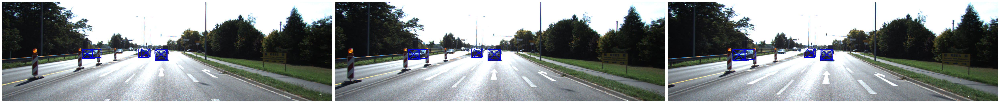

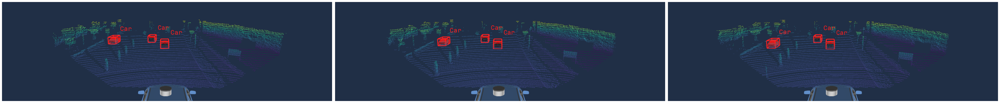

In [ ]:
# from importlib import reload
import view_utils  # Replace with your actual module name if different
# reload(view_utils)  # Force-reload the module
from view_utils import view_images  # Re-import the function
import glob

images_2d = sorted(glob.glob("frames/*.png"))
images_3d = sorted(glob.glob("3dframes/*.png"))

view_images(images_2d, cols=3, figsize=(50, 50))
view_images(images_3d, cols=3, figsize=(50, 50))

##### **MULTI-OBJECT TRACKER**
The main process will happen this way:
1. We load the LiDAR Point Cloud
2. We detect objects using Deep Learning on the LiDAR
3. We track these objects and display them on the image

For that, we'll need to download some weight files for the LiDAR Object detector, as well as some helper functions for tracking.

### Model Set up: 3D Object Detection: Use Point-RCNN to Make Your Own Labels!
Later, we'll work with Object Trackers. There are 2 types of trackers:
1.   **Separate Trackers**
2.   **Joint Trackers**

The first type first detect objects and then track them (using algorithms we explore in the course). The second type directly outputs tracking based on a sequence (2 images or files sent to a neural network, a tracking input).

In this notebook, we'll use the **first type**. And therefore our first task will be to detect the objects.
<p>

In this notebook, we'll focus on detecting the objects from point clouds and therefore run this as black box. You'll still be able to understand how this works, play with the point clouds, inputs and outputs.
<p>
There will however be a LiDAR Object Detection course available on Think Autonomous' platform.

[Be sure to be subscribed to my daily emails not to miss them](https://www.thinkautonomous.ai/py).

####PointRCNN
We'll use the library OpenPCDet, which will implement the PointRCNN algorithm based on [this repo](https://github.com/open-mmlab/OpenPCDet).<p>
Here's the architecture we've studied in the course:
![](https://images.velog.io/images/intuition/post/fa83aee5-179b-4f97-926c-2a84622dd417/pointrcnn_architecture.JPG)

In [ ]:
%%writefile model_setup.py

import os
import sys
import pcdet
from pcdet.config import cfg, cfg_from_yaml_file
from run_kitti_dataset import KittiDataset  # Ensure this import matches your file structure
from pcdet.models import build_network, load_data_to_gpu
from pcdet.utils import common_utils


def load_model_and_dataset(root, seq_id, label_path, cfg, logger, model_ckpt):
    """Loads model and dataset."""
    # Load the dataset
    dataset = KittiDataset(
        root_path=root,
        seq_id=seq_id,
        label_path=label_path,
        dataset_cfg=cfg.DATA_CONFIG,
        class_names=cfg.CLASS_NAMES
    )

    # Build and load the model
    model = build_network(model_cfg=cfg.MODEL, num_class=len(cfg.CLASS_NAMES), dataset=dataset)
    model.load_params_from_file(filename=model_ckpt, logger=logger, to_cpu=True)
    model.cuda()

    return model, dataset

Writing model_setup.py


In [ ]:
!/content/myenv/bin/python /content/model_setup.py

fatal: not a git repository (or any of the parent directories): .git


In [ ]:
%%writefile inference.py

import os
import sys
import torch
import numpy as np
from torch.utils.data import DataLoader
from box_3d import *

from model_setup import load_model_and_dataset
from pcdet.utils import common_utils
from pcdet.models import build_network
from pcdet.config import cfg, cfg_from_yaml_file


logger = common_utils.create_logger()
cfg_file = "/content/pointrcnn.yaml"
cfg_from_yaml_file(cfg_file, cfg)

root_path ="multi_object_tracking/data"
l_path = "multi_object_tracking/detectors/second_iou"
output_file_dir = "/content/output/0008/"
checkpoint_path = "/content/pointrcnn_7870.pth"
hand_picked_frames = [200, 201, 202]


model, dataset = load_model_and_dataset(root=root_path, seq_id=8, label_path=None, cfg=cfg, logger=logger, model_ckpt=checkpoint_path)
model.cuda()
model.eval()

# Label mapping (edit if needed)
id_to_name = {1: 'Car', 2: 'Pedestrian', 3: 'Cyclist', 4: 'Van'}

# Ensure output directory exists
os.makedirs(output_file_dir, exist_ok=True)

# ----------------------------
# Inference Loop
# ----------------------------
def load_data_to_gpu(batch_dict):
    for key, val in batch_dict.items():
        if isinstance(val, torch.Tensor):
            batch_dict[key] = val.cuda()
        elif isinstance(val, np.ndarray):
            batch_dict[key] = torch.from_numpy(val).float().cuda()
        elif isinstance(val, list) or isinstance(val, dict):
            batch_dict[key] = [load_data_to_gpu(v) for v in val] if isinstance(val, list) else {k: load_data_to_gpu(v) for k, v in val.items()}

def limit_period(val, offset=0.5, period=np.pi):
    return val - np.floor(val / period + offset) * period

with torch.no_grad():
    for i in hand_picked_frames:
        print(i)
        inference_result = []

        # read data
        data_dict = {k: dataset[i][k] for k in ["points", "frame_id"] if k in dataset[i]}
        data_dict = dataset.collate_batch([data_dict])  # ensures batch size = 1
        load_data_to_gpu(data_dict)

        # Forward propagation
        pred_dicts, _ = model.forward(data_dict)
        points = data_dict['points']
        bboxes = pred_dicts[0]['pred_boxes'].cpu().detach().numpy()
        scores = pred_dicts[0]['pred_scores'].cpu().detach().numpy()
        labels = pred_dicts[0]['pred_labels'].cpu().detach().numpy()
        P2 = np.column_stack((dataset[i]["P2"].T, [0, 0, 1, 0]))

        # Postprocess
        inference_result.append([])
        for bbox, score, label in zip(bboxes, scores, labels):
            pos = bbox[:3]  # x, y, z
            dim = bbox[[4, 5, 3]]  # w, h, l
            yaw = bbox[-1]
            yaw = -yaw - np.pi / 2
            yaw = limit_period(yaw, period=np.pi * 2)
            label_name = id_to_name[label]
            inference_result[-1].append(Box3D(pos, dim, yaw, label_name, score, dataset[i]["V2C"].T, P2))

        # Write to file
        output_file_name = os.path.join(output_file_dir, f"{str(i).zfill(6)}.txt")
        with open(output_file_name, 'w+') as f:
            for each_3d_box in inference_result[0]:
                f.write(each_3d_box.to_kitti_format(each_3d_box.confidence))
                f.write('\n')

        print(f"Written: {output_file_name}")

Writing inference.py


In [ ]:
!/content/myenv/bin/python /content/inference.py

fatal: not a git repository (or any of the parent directories): .git
2025-05-18 13:07:47,247   INFO  ==> Loading parameters from checkpoint /content/pointrcnn_7870.pth to CPU
2025-05-18 13:07:47,291   INFO  ==> Done (loaded 309/309)
200
/content/OpenPCDet/pcdet/ops/pointnet2/pointnet2_batch/pointnet2_utils.py:25: UserWarning: The torch.cuda.*DtypeTensor constructors are no longer recommended. It's best to use methods such as torch.tensor(data, dtype=*, device='cuda') to create tensors. (Triggered internally at ../torch/csrc/tensor/python_tensor.cpp:83.)
  output = torch.cuda.IntTensor(B, npoint)
Written: /content/output/0008/000200.txt
201
Written: /content/output/0008/000201.txt
202
Written: /content/output/0008/000202.txt


## Visualization after detection

In [ ]:
%%writefile main_detections.py

from vedo import *
import shutil
from visualize_scene import visualize_scene
from pcdet.config import cfg, cfg_from_yaml_file
from run_kitti_dataset import KittiDataset

cfg_file = "/content/pointrcnn.yaml"
cfg_from_yaml_file(cfg_file, cfg)

root ="multi_object_tracking/data"
seq_id = 8

prediction_path = "/content/output/"

dataset = KittiDataset(
    root_path=root,
    seq_id=seq_id,
    label_path=prediction_path,
    dataset_cfg=cfg.DATA_CONFIG,
    class_names=cfg.CLASS_NAMES
)

#If you need to restart the visualizer, remove the frames stored

shutil.rmtree('frames', ignore_errors=True)
shutil.rmtree("3dframes", ignore_errors= True)

### Visualize the same label indices to compare labels and model predictions
hand_picked_frames = [200,201,202]
settings.default_backend = '2d_image'
settings.default_image_path_for_2d_backend = '3dframes'

visualize_scene(dataset, hand_picked_frames, detection=True, tracking=None, threshold=0.7)

Writing main_detections.py


In [ ]:
!/content/myenv/bin/python /content/main_detections.py

fatal: not a git repository (or any of the parent directories): .git
The new directory 'frames' is created!
The new directory 3dframes is created!


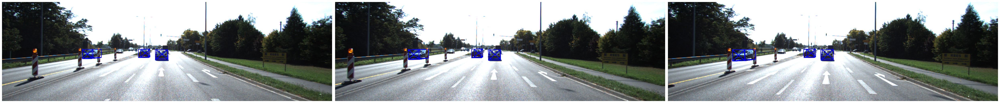

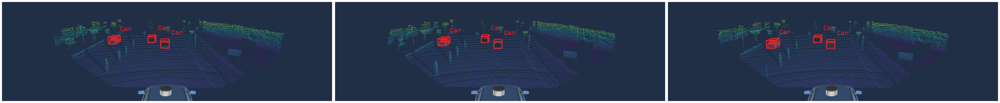

In [ ]:
# from importlib import reload
import view_utils  # Replace with your actual module name if different
# reload(view_utils)  # Force-reload the module
from view_utils import view_images  # Re-import the function
import glob

images_2d = sorted(glob.glob("frames/*.png"))
images_3d = sorted(glob.glob("3dframes/*.png"))

view_images(images_2d, cols=3, figsize=(50, 50))
view_images(images_3d, cols=3, figsize=(50, 50))

## **Video** 🎥
##### **First, run inference on a large set of frames, let's say 75 frames. Also try out inferencing on whole dataset!**

In [ ]:
%%writefile inference.py

import os
import sys
import torch
import numpy as np
from torch.utils.data import DataLoader
from box_3d import *

from model_setup import load_model_and_dataset
from pcdet.utils import common_utils
from pcdet.models import build_network
from pcdet.config import cfg, cfg_from_yaml_file


logger = common_utils.create_logger()
cfg_file = "/content/pointrcnn.yaml"
cfg_from_yaml_file(cfg_file, cfg)

root_path ="multi_object_tracking/data"
l_path = "multi_object_tracking/detectors/second_iou"
output_file_dir = "/content/output/0008"
checkpoint_path = "/content/pointrcnn_7870.pth"
hand_picked_frames = range(75)


model, dataset = load_model_and_dataset(root=root_path, seq_id=8, label_path=None, cfg=cfg, logger=logger, model_ckpt=checkpoint_path)
model.cuda()
model.eval()

# Label mapping (edit if needed)
id_to_name = {1: 'Car', 2: 'Pedestrian', 3: 'Cyclist', 4: 'Van'}

# Ensure output directory exists
os.makedirs(output_file_dir, exist_ok=True)

# ----------------------------
# Inference Loop
# ----------------------------
def load_data_to_gpu(batch_dict):
    for key, val in batch_dict.items():
        if isinstance(val, torch.Tensor):
            batch_dict[key] = val.cuda()
        elif isinstance(val, np.ndarray):
            batch_dict[key] = torch.from_numpy(val).float().cuda()
        elif isinstance(val, list) or isinstance(val, dict):
            batch_dict[key] = [load_data_to_gpu(v) for v in val] if isinstance(val, list) else {k: load_data_to_gpu(v) for k, v in val.items()}

def limit_period(val, offset=0.5, period=np.pi):
    return val - np.floor(val / period + offset) * period

with torch.no_grad():
    for i in hand_picked_frames:
        print(i)
        inference_result = []

        # read data
        data_dict = {k: dataset[i][k] for k in ["points", "frame_id"] if k in dataset[i]}
        data_dict = dataset.collate_batch([data_dict])  # ensures batch size = 1
        load_data_to_gpu(data_dict)

        # Forward propagation
        pred_dicts, _ = model.forward(data_dict)
        points = data_dict['points']
        bboxes = pred_dicts[0]['pred_boxes'].cpu().detach().numpy()
        scores = pred_dicts[0]['pred_scores'].cpu().detach().numpy()
        labels = pred_dicts[0]['pred_labels'].cpu().detach().numpy()
        P2 = np.column_stack((dataset[i]["P2"].T, [0, 0, 1, 0]))
        ######  prints of preds ########### !!!!!

        # Postprocess
        inference_result.append([])
        for bbox, score, label in zip(bboxes, scores, labels):
            pos = bbox[:3]  # x, y, z
            dim = bbox[[4, 5, 3]]  # w, h, l
            yaw = bbox[-1]
            yaw = -yaw - np.pi / 2
            yaw = limit_period(yaw, period=np.pi * 2)
            label_name = id_to_name[label]
            inference_result[-1].append(Box3D(pos, dim, yaw, label_name, score, dataset[i]["V2C"].T, P2))

        # Write to file
        output_file_name = os.path.join(output_file_dir, f"{str(i).zfill(6)}.txt")
        with open(output_file_name, 'w+') as f:
            for each_3d_box in inference_result[0]:
                f.write(each_3d_box.to_kitti_format(each_3d_box.confidence))
                f.write('\n')

        print(f"Written: {output_file_name}")

Overwriting inference.py


In [ ]:
!/content/myenv/bin/python /content/inference.py

fatal: not a git repository (or any of the parent directories): .git
2025-05-18 13:08:20,377   INFO  ==> Loading parameters from checkpoint /content/pointrcnn_7870.pth to CPU
2025-05-18 13:08:20,406   INFO  ==> Done (loaded 309/309)
0
/content/OpenPCDet/pcdet/ops/pointnet2/pointnet2_batch/pointnet2_utils.py:25: UserWarning: The torch.cuda.*DtypeTensor constructors are no longer recommended. It's best to use methods such as torch.tensor(data, dtype=*, device='cuda') to create tensors. (Triggered internally at ../torch/csrc/tensor/python_tensor.cpp:83.)
  output = torch.cuda.IntTensor(B, npoint)
Written: /content/output/0008/000000.txt
1
Written: /content/output/0008/000001.txt
2
Written: /content/output/0008/000002.txt
3
Written: /content/output/0008/000003.txt
4
Written: /content/output/0008/000004.txt
5
Written: /content/output/0008/000005.txt
6
Written: /content/output/0008/000006.txt
7
Written: /content/output/0008/000007.txt
8
Written: /content/output/0008/000008.txt
9
Written: /co

In [ ]:
%%writefile main_detections_visualization.py

from vedo import *
import shutil
from visualize_scene import visualize_scene
from pcdet.config import cfg, cfg_from_yaml_file
from run_kitti_dataset import KittiDataset

cfg_file = "/content/pointrcnn.yaml"
cfg_from_yaml_file(cfg_file, cfg)

root ="multi_object_tracking/data"
seq_id = 8

prediction_path = "/content/output/"

dataset = KittiDataset(
    root_path=root,
    seq_id=seq_id,
    label_path=prediction_path,
    dataset_cfg=cfg.DATA_CONFIG,
    class_names=cfg.CLASS_NAMES
)

#If you need to restart the visualizer, remove the frames stored

shutil.rmtree('frames', ignore_errors=True)
shutil.rmtree("3dframes", ignore_errors= True)

### Create 2d and 3d Frames on all 75 Detections!
hand_picked_frames = range(75)
settings.default_backend = '2d_image'
settings.default_image_path_for_2d_backend = '3dframes'

visualize_scene(dataset, hand_picked_frames, detection=True, tracking=None, threshold=0.5)

Writing main_detections_visualization.py


In [ ]:
!/content/myenv/bin/python /content/main_detections_visualization.py

fatal: not a git repository (or any of the parent directories): .git
The new directory 'frames' is created!
The new directory 3dframes is created!


In [ ]:
%%writefile generate_video_main.py


import glob
import cv2
from tqdm import tqdm

hand_picked_frames=range(75)

def generate_video(globInputPath, outvideoFileName):
    video_images = sorted(glob.glob(globInputPath))

    # Validate dimensions
    first_img = cv2.imread(video_images[0])
    h, w = first_img.shape[:2]

    result_video = []
    for out_img in tqdm(video_images):
        img = cv2.imread(out_img)
        if img.shape != (h, w, 3):
            raise ValueError(f"Image {out_img} has invalid dimensions")
        result_video.append(img)

    # Create video writer
    out = cv2.VideoWriter(
        outvideoFileName,
        cv2.VideoWriter_fourcc(*'mp4v'),
        15,
        (w, h)
    )

    for img in result_video:
        out.write(img)  # Directly write BGR data
    out.release()
    print(f"✅ {outvideoFileName} generated")

# Usage
generate_video("/content/frames/*.png", "2d_OD.mp4")
generate_video("/content/3dframes/*.png", "3d_OD.mp4")

Writing generate_video_main.py


In [ ]:
!/content/myenv/bin/python /content/generate_video_main.py

100% 75/75 [00:00<00:00, 98.08it/s] 
✅ 2d_OD.mp4 generated
100% 75/75 [00:00<00:00, 195.93it/s]
✅ 3d_OD.mp4 generated


In [ ]:
!ls -lh /content/*.mp4

-rw-r--r-- 1 root root 5.1M May 18 13:10 /content/2d_OD.mp4
-rw-r--r-- 1 root root 3.4M May 18 13:10 /content/3d_OD.mp4


# Run an output video

In [ ]:
%%writefile display_video_output.py


import cv2
import numpy as np
from tqdm import tqdm

hand_picked_frames=range(75)

def merge_videos(video_paths, output_path, layout="vertical", titles=None, max_frames=75):
    caps = [cv2.VideoCapture(vp) for vp in video_paths]

    # Get first frame dimensions
    ret, frame = caps[0].read()
    if not ret:
        raise ValueError("Could not read first frame")
    h, w = frame.shape[:2]
    caps[0].set(cv2.CAP_PROP_POS_FRAMES, 0)

    # Configure layout
    if layout == "vertical":
        merged_w = w
        merged_h = h * 2  # 2 rows
    else:  # horizontal
        merged_w = w * 2  # 2 columns
        merged_h = h

    out = cv2.VideoWriter(output_path, cv2.VideoWriter_fourcc(*'mp4v'), 15, (merged_w, merged_h))

    for _ in tqdm(range(max_frames), desc="Merging"):
        frames = []
        for idx, cap in enumerate(caps):
            ret, frame = cap.read()
            if not ret:
                frame = np.zeros((h, w, 3), dtype=np.uint8)
            frames.append(frame)

        # Combine based on layout
        if layout == "vertical":
            combined = np.vstack(frames)  # 2 rows
        else:
            combined = np.hstack(frames)  # 2 columns

        out.write(combined)

    out.release()
    print(f"✅ Saved merged video to {output_path}")

# Usage example
merge_videos(
    video_paths=['2d_OD.mp4', '3d_OD.mp4'],
    output_path="merged_output.mp4",
    layout="vertical",  # or "horizontal"
    titles=['Point-RCNN (Image)', 'Point-RCNN (LiDAR)'],
    max_frames=75
)

Writing display_video_output.py


In [ ]:
!/content/myenv/bin/python /content/display_video_output.py

Merging: 100% 75/75 [00:00<00:00, 82.91it/s]
✅ Saved merged video to merged_output.mp4


In [ ]:
!ffmpeg -i /content/merged_output.mp4 -vcodec libx264 -pix_fmt yuv420p /content/merged_output_fixed.mp4

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [ ]:
from IPython.display import Video
Video('/content/merged_output_fixed.mp4', embed=True)